# Global fit to all three K2 campaign lightcurves

July 2019 MGS

with ASASSN and for all campaigns with PSD analysis.

In [1]:
# %load /Users/obsidian/Desktop/defaults.py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
from astropy.stats import LombScargle
import astropy.units as u
from astropy.time import Time

In [3]:
import celerite
from celerite import terms

# subsub K2

In a previous notebook, we made detrended lightcurves with the lightkurve implementation of SFF and saved them to csv files locally.  We'll read those back in as DataFrames.

In [4]:
dfC05 = pd.read_csv('../data/K2/S1063_K2_C05_lightkurve_SFF.csv')
dfC05['Campaign'] = 5
dfC16 = pd.read_csv('../data/K2/S1063_K2_C16_lightkurve_SFF.csv')
dfC16['Campaign'] = 16
dfC18 = pd.read_csv('../data/K2/S1063_K2_C18_lightkurve_SFF.csv')
dfC18['Campaign'] = 18

In [5]:
# Here we retroactively assign the campaign zeropoints, which are not known a-priori.
C05_const, C16_const, C18_const = 76956.4/1.025, 73136.2, 77089.98/1.065 # iteratively computed at bottom.

In [6]:
dfC05['flux'] = dfC05['flux'] / C05_const
dfC16['flux'] = dfC16['flux'] / C16_const
dfC18['flux'] = dfC18['flux'] / C18_const

df = pd.concat([dfC05, dfC16, dfC18], ignore_index=True)

# df['flux'] = df.flux / np.percentile(df.flux, 98) Turn of if you normalize campaigns separately!
df['flux_err'] = df.flux *0.005

### ASASSN data 

We have the ASASSN data saved locally.  Recall that the ASASSN pixels likely have some degree of contamination from a nearby star.

In [7]:
usecols = ['HJD', 'flux(mJy)', 'flux_err', 'Filter']
df_ASASSN = pd.read_csv('../data/raw/ASASSN/S1063_ASASSN_20190123.csv', usecols=usecols)

# Tidy up the dataframe
df_ASASSN = df_ASASSN[df_ASASSN.flux_err!=99.990].reset_index(drop=True)
df_ASASSN.rename(columns={'flux(mJy)':'flux', 'HJD':'time'},inplace=True)
df_ASASSN['time'] = df_ASASSN['time'] - 2454833.0

# Focus on one filter at a time...
filt = 'V'
df_ASASSN = df_ASASSN[df_ASASSN.Filter == filt].reset_index(drop=True)[['time', 'flux', 'flux_err']]
const = np.percentile(df_ASASSN.flux, 80)

# Normalize
df_ASASSN['flux'] /=const
df_ASASSN['flux_err'] /=const

# drop outliers
good_mask = (df_ASASSN.flux > 0.7) & (df_ASASSN.time < 3500)
df_ASASSN = df_ASASSN[good_mask].reset_index(drop=True)

### AAVSO data

The exact properties of the photometric systems are difficult to verify for AAVSO data, but let's keep track of them anyways.

In [8]:
keep_cols = ['JD', 'Magnitude', 'Uncertainty', 'Band']
df_AAVSO = pd.read_csv('../data/raw/aavsodata_5c5df877134a9.txt', usecols=keep_cols)

v_band = df_AAVSO.Band == 'V'

df_AAVSO['mag']= df_AAVSO.Magnitude.str.lstrip('<').astype(np.float)
df_AAVSO['JD_like']= df_AAVSO.JD.astype(np.float)

df_AAVSO = df_AAVSO[v_band]
df_AAVSO = df_AAVSO.reset_index(drop=True)[['JD_like', 'mag', 'Uncertainty', 'Band']]

In [9]:
df_AAVSO['flux'] = 10**(df_AAVSO.mag/-2.5)
const = np.nanmedian(df_AAVSO['flux'])
df_AAVSO['flux'] = df_AAVSO['flux'] / const
df_AAVSO['time'] = df_AAVSO.JD_like - 2454833.0

Overview of all available photometry.

In [10]:
times = ['2012-01-01T00:00:00.0','2013-01-01T00:00:00.0','2014-01-01T00:00:00.0', '2015-01-01T00:00:00.0', 
         '2016-01-01T00:00:00.0', '2017-01-01T00:00:00.0', '2018-01-01T00:00:00.0','2019-01-01T00:00:00.0']
nye_t = Time(times, format='isot', scale='utc')
nye_tick_locations = nye_t.jd - 2454833

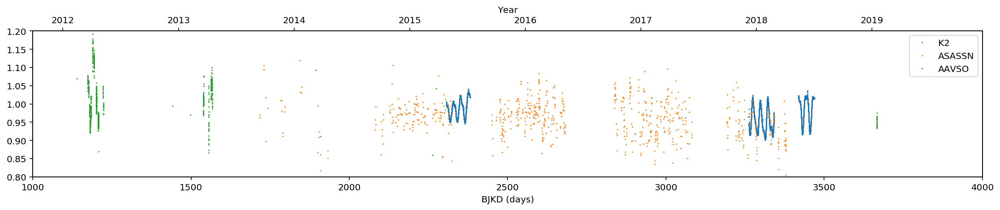

In [11]:
fig = plt.figure(figsize=(19, 3))
ax1 = fig.add_subplot(111)
plt.plot(df.time, df.flux.values, '.', label='K2', ms=1)
#plt.plot(dfC05.time, dfC05.flux/ np.percentile(dfC05.flux, 98), 'r.')
plt.plot(df_ASASSN.time, df_ASASSN.flux, '.', label='ASASSN',ms=1)
plt.plot(df_AAVSO.time, df_AAVSO.flux, '.', label='AAVSO',ms=1)
plt.xlim(1000, 4000)
plt.ylim(0.8, 1.2)
plt.xlabel('BJKD (days)')
plt.legend()
ax2 = ax1.twiny()
ax2.set_xlim(1000, 4000)
#ax2.set_xlim(3200, 3470)
ax2.set_xticks(nye_tick_locations)
ax2.set_xticklabels(nye_t.decimalyear.astype(np.int))
ax2.set_xlabel("Year");

## Make the Power Spectrum

Let's create the power spectrum separately for each campaign.  This approach allows us to not worry about the mean level that we assign to each campaign, and it helps see which PSD structures persist from campaign to campaign.

In [12]:
df['t_sec'] = (df.time.values*u.day).to(u.second).value
df_PSD = pd.DataFrame()

In [13]:
over_sample=10

In [14]:
for campaign in [5, 16, 18, -1]:
    this_df = df[df.Campaign == campaign].reset_index(drop=True)
    if campaign == -1:
        this_df = df
    this_PSD = pd.DataFrame()
    this_PSD['freq'] = np.fft.rfftfreq(len(this_df)*over_sample, 
                                       (df['t_sec'][1] - df['t_sec'][0]))[1:-1]
    this_PSD['PSD'] = this_PSD['freq']*0

    model = LombScargle(this_df.t_sec.values, this_df.flux.values)
    power_ls = model.power(this_PSD['freq'].values, method="cython", normalization="psd") / len(this_df)

    this_PSD['PSD'] = power_ls
    this_PSD['Campaign'] = campaign
    df_PSD = df_PSD.append(this_PSD, ignore_index=True)

In [15]:
t_motion = (6.0*u.hour).to(u.second)

In [16]:
guess_period = (23.5 * u.day).to(u.second).value
guess2_period = (12.5 * u.day).to(u.second).value

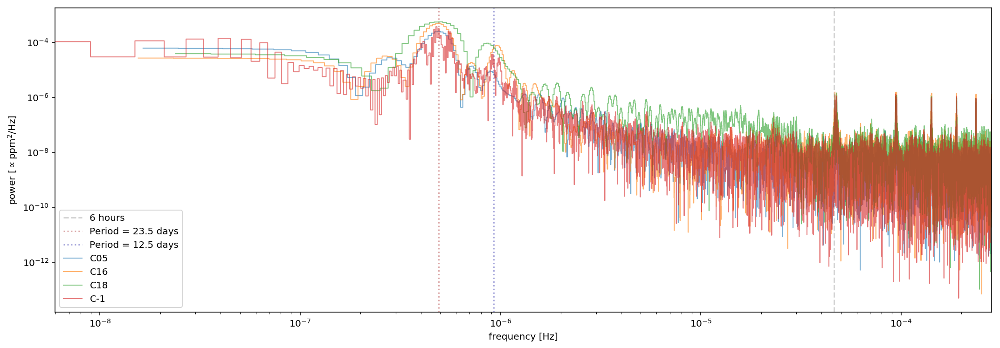

In [17]:
plt.figure(figsize=(18,6))
plt.axvline(1.0/t_motion.value, color='#aaaaaa', linestyle='dashed', label='6 hours', alpha=0.5)

plt.axvline(1.0/guess_period, color='#ddaaaa', linestyle='dotted', label='Period = 23.5 days', alpha=1)

plt.axvline(1.0/guess2_period, color='#aaaadd', linestyle='dotted', label='Period = 12.5 days', alpha=1)

for campaign in [5, 16, 18, -1]:
    mask = df_PSD.Campaign == campaign
    plt.step(df_PSD['freq'][mask], df_PSD['PSD'][mask], label="C{:02d}".format(campaign), 
             where='mid', alpha=0.6, lw=1)

plt.yscale("log")
plt.xscale("log")
plt.xlim(df_PSD.freq.min(), df_PSD.freq.max())
plt.ylabel("power [$\propto \mathrm{ppm}^2/\mathrm{Hz}$]")
plt.xlabel("frequency [Hz]")

plt.legend(loc='best')

Nice.  Let's model it!

In [18]:
variance = np.var(df.flux.values)

#### A periodic term

In [19]:
Q_guess = 25.0
w0_guess = 2.0*np.pi / guess_period
S0_guess = variance * 30000.0

bounds1 = dict(log_S0=(-0.5, 8.7), log_Q=(1.09, 3.9), log_omega0=(-12.95, -12.44))

kernel_sho = terms.SHOTerm(log_S0=np.log(S0_guess), log_Q=np.log(Q_guess), 
                       log_omega0=np.log(w0_guess), bounds=bounds1)

#### A random walk term

In [20]:
t_char = (0.05*u.year).to(u.second)
c_val = 2.0*np.pi * 1/(t_char)
a_val = c_val*2e1

In [21]:
bounds_rw = dict(log_c=(-14.7, -10.1), log_a=(-14.0, -4.8))
true_logc, true_loga = np.log(c_val.value) , np.log(a_val.value)
kernel_drw = terms.RealTerm(log_a=true_loga, log_c=true_logc, bounds=bounds_rw)

#### A second periodic term

In [22]:
guess_period2 = (12.5 * u.day).to(u.second).value

In [23]:
Q2_guess = 19.0
w02_guess = 2.0*np.pi / guess_period2
S02_guess = variance * 5000.0

bounds_sho2 = dict(log_S0=(-2.0, 7.1), log_Q=(0.69, 3.2), log_omega0=(-12.40, -11.1))

kernel_sho2 = terms.SHOTerm(log_S0=np.log(S02_guess), log_Q=np.log(Q2_guess), 
                       log_omega0=np.log(w02_guess), bounds=bounds_sho2)

#### A long-term trend term

In [24]:
long_term_turnover = 0.5 * u.year.to(u.second)
Q3_fixed = 1.0/np.sqrt(2)
w03_guess = 2.0*np.pi / long_term_turnover
S03_guess = variance * 4000000.0

bounds_lt = dict(log_S0=(2.5, 11.7), log_Q=(-0.347573, -0.345574), log_omega0=(-17.0, -13.1))

kernel_sho3 = terms.SHOTerm(log_S0=np.log(S03_guess), log_Q=np.log(Q3_fixed), 
                       log_omega0=np.log(w03_guess), bounds=bounds_lt)

#### A Jitter term 

In [25]:
log_sig = np.log(0.00200)

bounds_jit = dict(log_sigma=(-10.4, -4.6))
kernel_jit = terms.JitterTerm(log_sigma=log_sig, bounds = bounds_jit)

#### Let's leave out the DRW term for now!

In [27]:
#net_kernel = kernel_sho + kernel_drw + kernel_sho2 + kernel_sho3 + kernel_jit
net_kernel = kernel_sho + kernel_sho2 + kernel_sho3 + kernel_jit
gp = celerite.GP(net_kernel, fit_mean=True, mean=0.95)
gp.compute(df.t_sec.values)

In [28]:
f = np.fft.rfftfreq(len(df)*over_sample, df['t_sec'][1] - df['t_sec'][0])[1:-1]
time_baseline = df.t_sec.iloc[-1] - df.t_sec.iloc[0]
NN = len(df)

In [29]:
power_true = net_kernel.get_psd(2*np.pi*f) / (0.5 * time_baseline)
power_sho = kernel_sho.get_psd(2*np.pi*f) / (0.5 * time_baseline)
power_drw = kernel_drw.get_psd(2*np.pi*f) / (0.5 * time_baseline)
power_sho2 = kernel_sho2.get_psd(2*np.pi*f) / (0.5 * time_baseline)
power_sho3 = kernel_sho3.get_psd(2*np.pi*f) / (0.5 * time_baseline)
power_jit = kernel_jit.jitter * NN * np.ones(len(f)) / (0.5 * time_baseline)

power_post = gp.kernel.get_psd(2*np.pi*f) / (0.5 * time_baseline)

In [30]:
flux_draw = gp.sample()

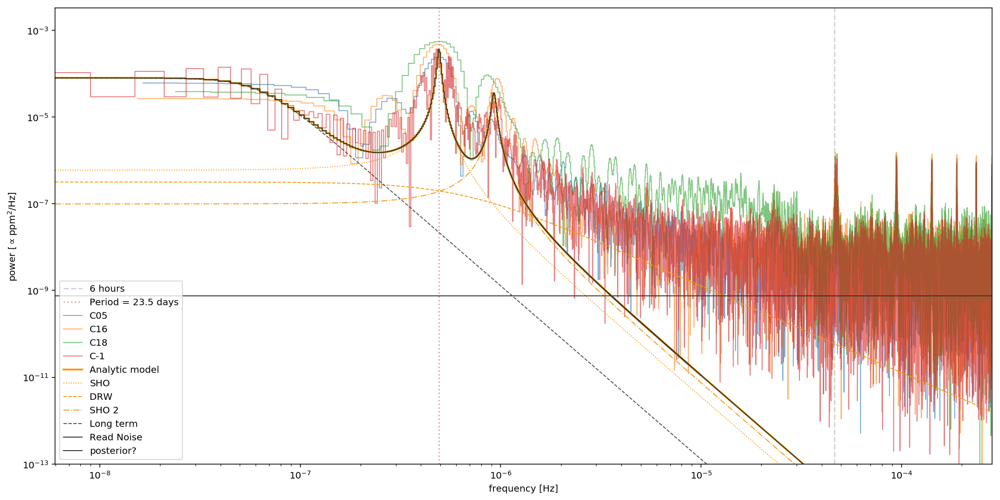

In [31]:
plt.figure(figsize=(18,9))
plt.axvline(1.0/t_motion.value, color='#aaaaaa', linestyle='dashed', label='6 hours', alpha=0.5)

plt.axvline(1.0/guess_period, color='#ddaaaa', linestyle='dotted', label='Period = 23.5 days', alpha=1)

for campaign in [5, 16, 18, -1]:
    mask = df_PSD.Campaign == campaign
    plt.step(df_PSD['freq'][mask], df_PSD['PSD'][mask], label="C{:02d}".format(campaign), 
             where='mid', alpha=0.6, lw=1)

plt.step(f, power_true, color='#f39c12', lw=2,label="Analytic model", where='mid')
plt.plot(f, power_sho, ':', color='#f39c12', lw=1,label="SHO")
plt.plot(f, power_drw, '--', color='#f39c12', lw=1,label="DRW")
plt.plot(f, power_sho2, '-.', color='#f39c12', lw=1,label="SHO 2")
plt.plot(f, power_sho3, '--', color='#555555', lw=1,label="Long term")
plt.plot(f, power_jit, '-', color='#333333', lw=1,label="Read Noise")

plt.step(f, power_post, color='#333333', lw=1,label="posterior?", where='mid')

#plt.plot(f_highres, power_hires, '--', color='#d35400', lw=1,label="Over sampled", alpha=0.4)

plt.yscale("log")
plt.xscale("log")
plt.xlim(f.min(), f.max())
plt.ylabel("power [$\propto \mathrm{ppm}^2/\mathrm{Hz}$]")
plt.xlabel("frequency [Hz]")
plt.ylim(1e-13)

plt.legend(loc='best')
#plt.savefig('../results/subsub_PSD_celerite_model.png', dpi=300, bbox_inches='tight')

Awesome!  Let's spot-check our results by making a draw from the model and then computing as if it were data.

## MCMC Sample!

We'll focus on one campaign at a time.

In [ ]:
import emcee

In [33]:
this_df = df[df.Campaign == 16].reset_index(drop=True)

In [34]:
this_df.head()

,time,flux,Campaign,flux_err,t_sec
0,3262.467428,0.943994,16,0.004720,2.818772e+08
1,3262.487863,0.942416,16,0.004712,2.818790e+08
2,3262.508299,0.941902,16,0.004710,2.818807e+08
3,3262.528734,0.942191,16,0.004711,2.818825e+08
4,3262.549170,0.941692,16,0.004708,2.818842e+08


In [35]:
gp.compute(this_df.t_sec.values)

Let's fix the long-term trend to be exactly $Q=\frac{1}{\sqrt{2}}$.

In [43]:
gp.freeze_parameter('kernel:terms[2]:log_Q')

In [45]:
def log_probability(params):
    gp.set_parameter_vector(params)
    lp = gp.log_prior()
    if not np.isfinite(lp):
        return -np.inf
    return gp.log_likelihood(y) + lp

In [51]:
initial = gp.get_parameter_vector()
nparams = len(initial)

In [52]:
ndim, nwalkers = nparams, 40
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability, threads=8)

In [53]:
p0 = initial + 1e-4 * np.random.randn(nwalkers, ndim)

In [54]:
%%time
p0, lp, _ = sampler.run_mcmc(p0, 5000)

CPU times: user 13.2 s, sys: 1.63 s, total: 14.8 s
Wall time: 44.4 s


In [55]:
#print("Running production...")
#sampler.run_mcmc(p0, 5000);

In [56]:
names = ['t'+name[12:] for name in gp.get_parameter_names()]
names[-1] = 'mean'

In [57]:
sampler.chain.T.shape

(10, 5000, 40)

In [58]:
sampler.chain.shape

(40, 5000, 10)

CPU times: user 432 ms, sys: 57.2 ms, total: 490 ms
Wall time: 487 ms


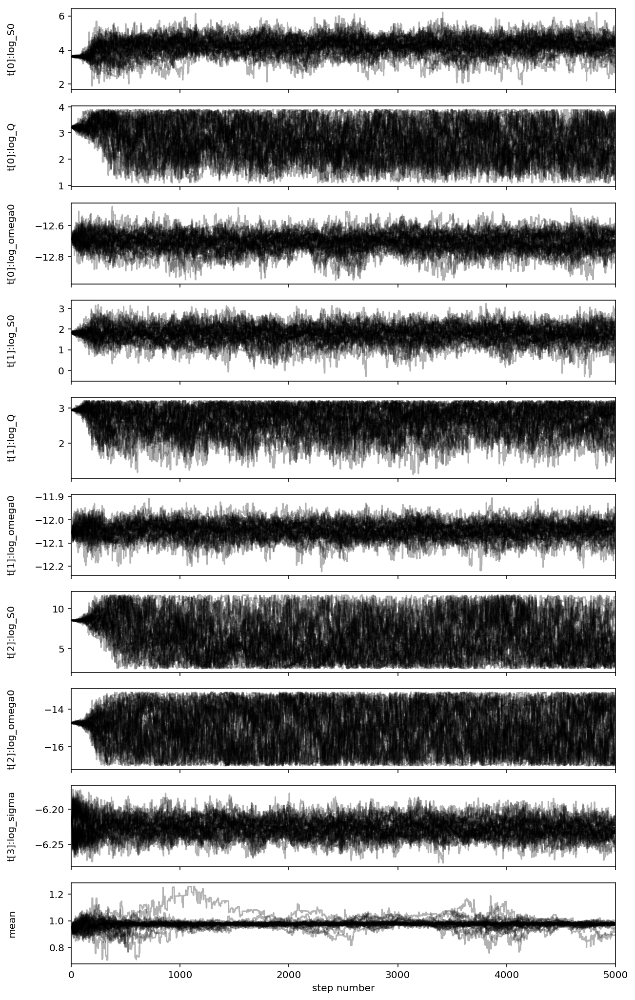

In [61]:
%%time
fig, axes = plt.subplots(nparams, figsize=(10, 18), sharex=True)
samples = sampler.chain
labels = names
for i in range(nparams):
    ax = axes[i]
    ax.plot(samples[:, :, i].T, "k", alpha=0.3)
    ax.set_xlim(0, 5000)
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");

Make a burned-in, flat chain to sample from.

In [63]:
burned = samples[:, 4000:, :]

In [64]:
burned.shape

(40, 1000, 10)

In [66]:
flat_chain = burned.reshape(40000, 10)

In [67]:
np.percentile(flat_chain[:, 2], (5,50,95))

array([-12.79655655, -12.70643936, -12.61947907])

In [98]:
posterior_power = []

In [99]:
%%time
n_draws = 1000
for i in range(n_draws):
    samp = flat_chain[np.random.randint(0, 40000)]
    gp.set_parameter_vector(samp)
    this_power = gp.kernel.get_psd(2*np.pi*f) / (0.5 * time_baseline)
    #this_jitter = np.exp(samp[-2]) * len(this_df) * np.ones(len(f)) / (0.5 * time_baseline)
    posterior_power.append(this_power)

CPU times: user 955 ms, sys: 105 ms, total: 1.06 s
Wall time: 1.06 s


In [100]:
posterior_power = np.array(posterior_power)

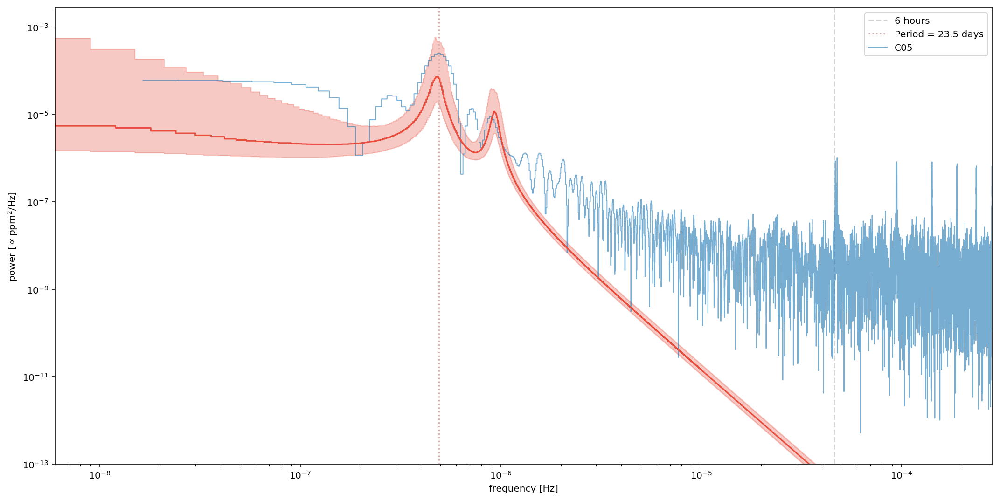

In [101]:
plt.figure(figsize=(18,9))
plt.axvline(1.0/t_motion.value, color='#aaaaaa', linestyle='dashed', label='6 hours', alpha=0.5)

plt.axvline(1.0/guess_period, color='#ddaaaa', linestyle='dotted', label='Period = 23.5 days', alpha=1)

for campaign in [5]:
    mask = df_PSD.Campaign == campaign
    plt.step(df_PSD['freq'][mask], df_PSD['PSD'][mask], label="C{:02d}".format(campaign), 
             where='mid', alpha=0.6, lw=1)

plt.step(f, np.percentile(posterior_power, 50, axis=0), color='#e74c3c')
plt.fill_between(f, np.percentile(posterior_power, 5, axis=0),
                 np.percentile(posterior_power, 95, axis=0), alpha=0.3,
                 color='#e74c3c', step='mid')
    
plt.yscale("log")
plt.xscale("log")
plt.xlim(f.min(), f.max())
plt.ylabel("power [$\propto \mathrm{ppm}^2/\mathrm{Hz}$]")
plt.xlabel("frequency [Hz]")
plt.ylim(1e-13)

plt.legend(loc='best')

In [102]:
import corner

In [104]:
flat_chain.shape

(40000, 10)

In [110]:
omegas = flat_chain[:, (2,5)]

In [115]:
periods = (2 * np.pi / np.exp(omegas))*u.second.to(u.day)

In [117]:
periods.shape

(40000, 2)

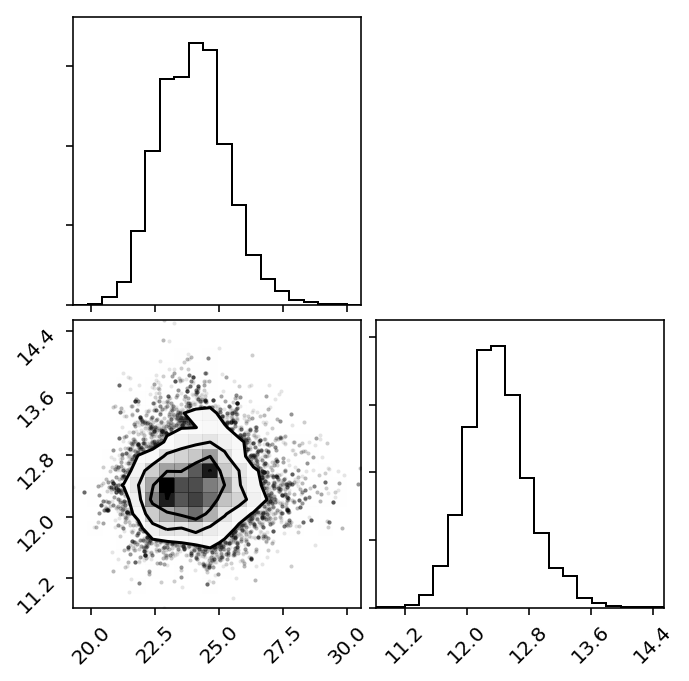

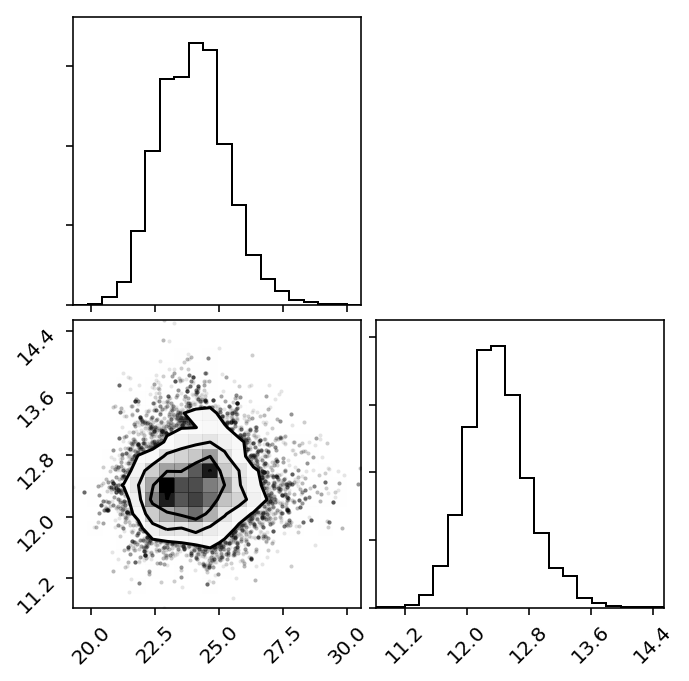

In [118]:
corner.corner(periods, )

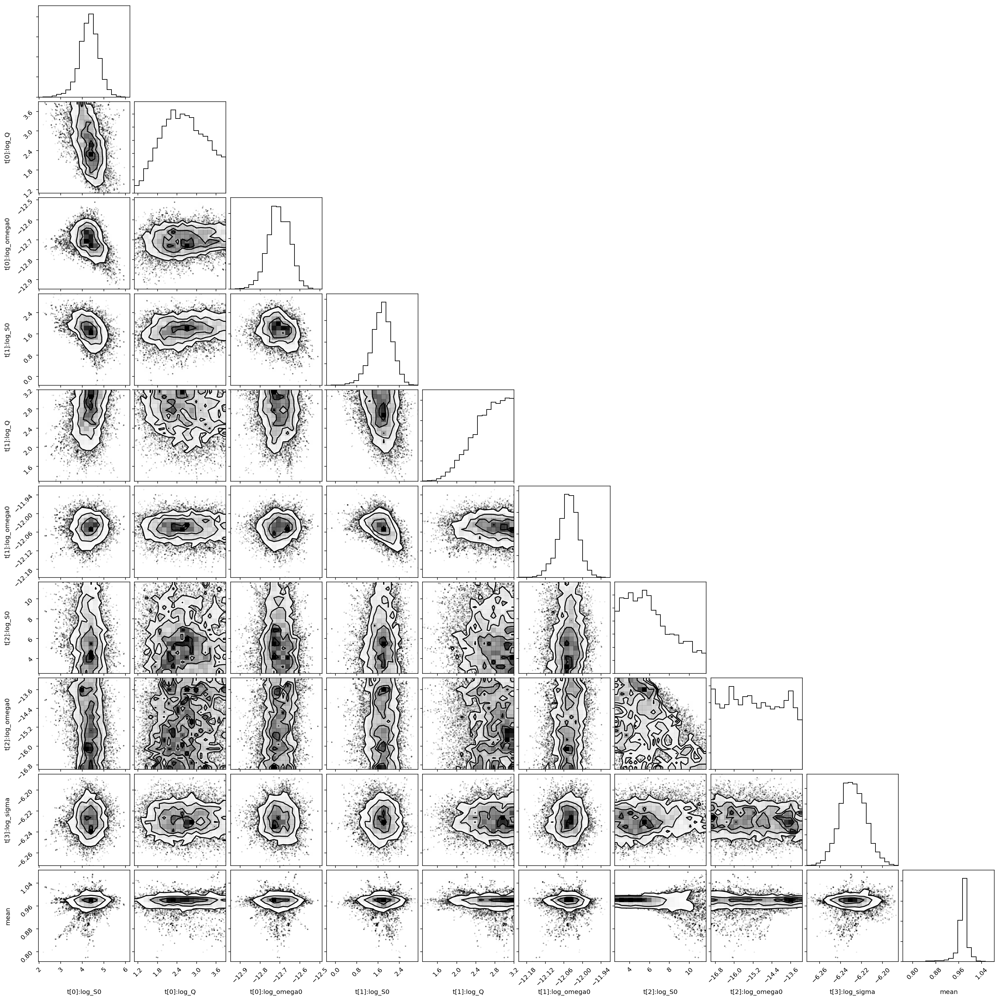

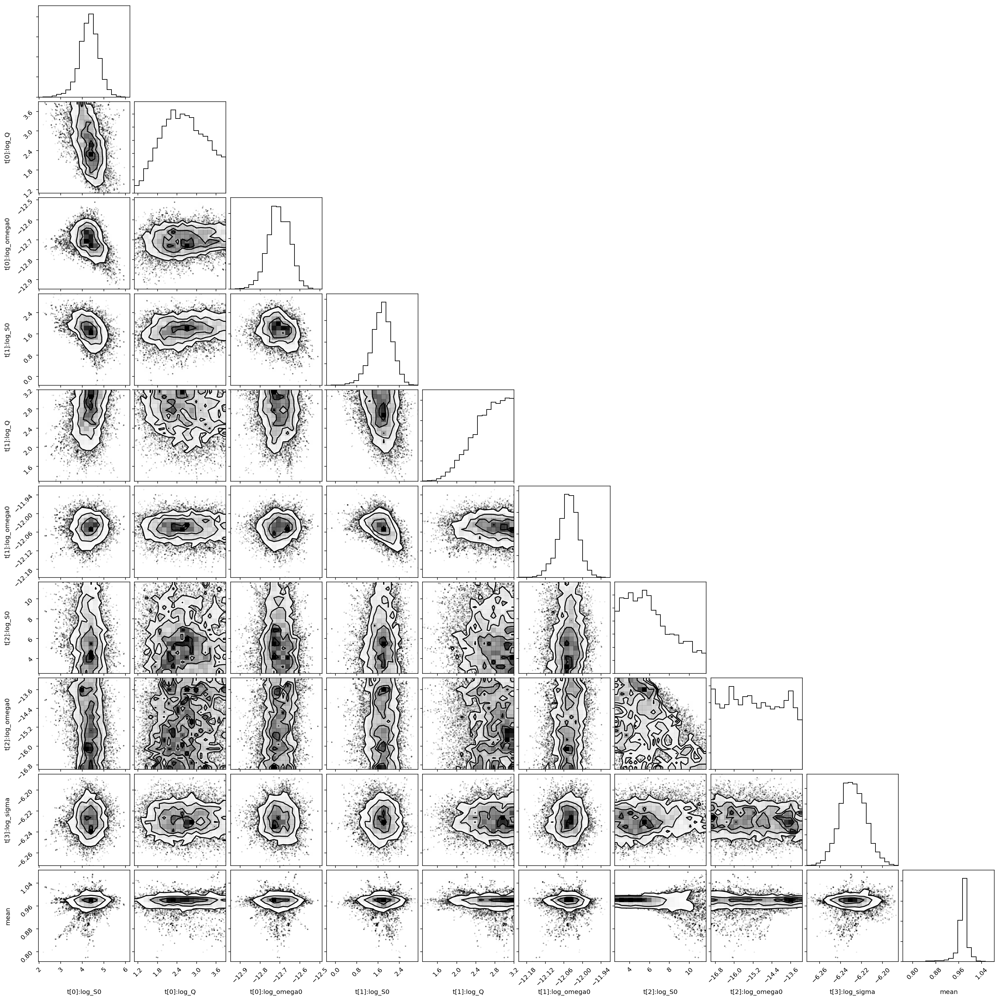

In [120]:
corner.corner(flat_chain, labels=names)

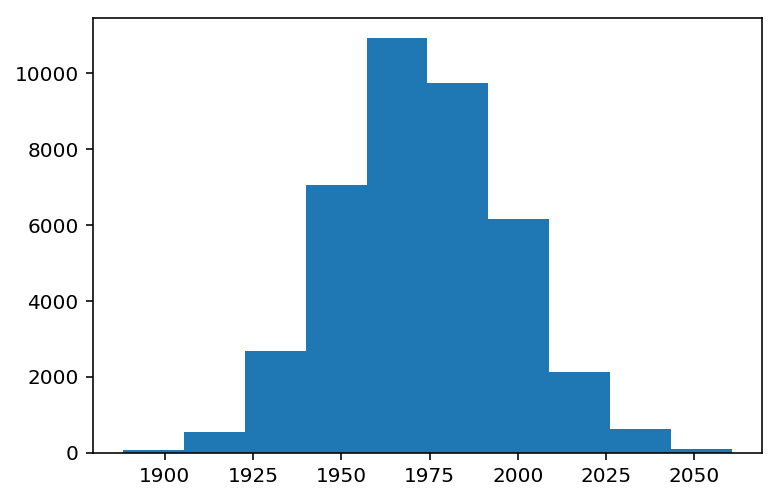

In [126]:
plt.hist(np.exp(flat_chain[:, 8])*1000000);

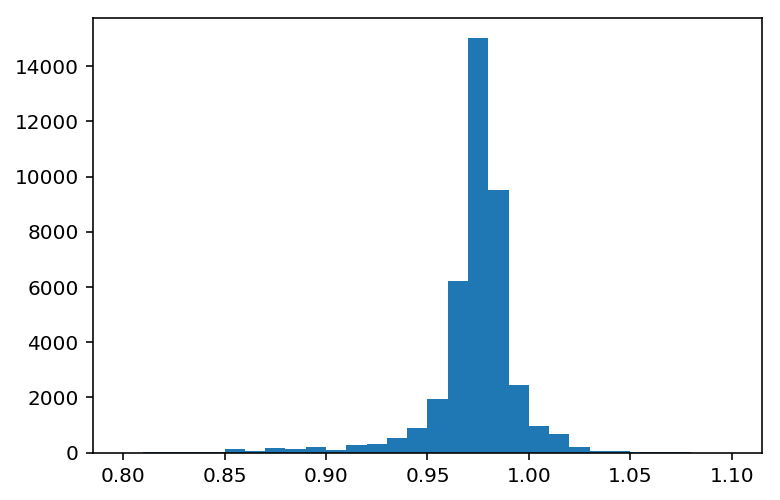

In [129]:
plt.hist(flat_chain[:, 9], bins=np.arange(0.8, 1.1, 0.01));

Play with simulated data.

In [59]:
model = LombScargle(t, y)
power_draw = model.power(f[1:-1], method="cython", normalization="psd") / NN

In [56]:
y_many = gp.sample(size=1000)

In [58]:
%%time
power_ls = []
for y0 in y_many:
    model = LombScargle(t, y0)
    power_ls.append(model.power(f[1:-1], method="fast", normalization="psd"))

power_ls = np.array(power_ls)

# >>> To get the LS based PSD in the correct units, normalize by N <<<
power_ls /= NN

CPU times: user 1min 9s, sys: 4.17 s, total: 1min 13s
Wall time: 18.8 s


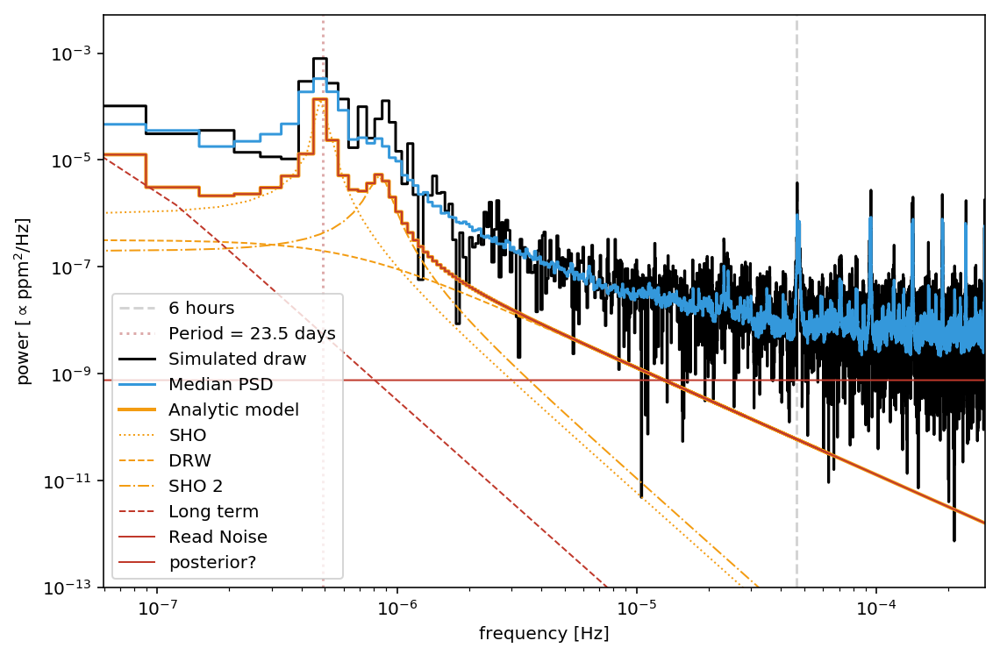

In [63]:
plt.figure(figsize=(9,6))
plt.axvline(1.0/t_motion.value, color='#aaaaaa', linestyle='dashed', label='6 hours', alpha=0.5)

plt.axvline(1.0/guess_period, color='#ddaaaa', linestyle='dotted', label='Period = 23.5 days', alpha=1)

plt.step(f[1:-1], power_draw,label="Simulated draw", color='k', where='mid')

plt.step(f[1:-1], np.median(power_ls, axis=0), label="Median PSD", color='#3498db', where='mid', alpha=1)

plt.step(f, power_true, color='#f39c12', lw=2,label="Analytic model", where='mid')
plt.plot(f, power_sho, ':', color='#f39c12', lw=1,label="SHO")
plt.plot(f, power_drw, '--', color='#f39c12', lw=1,label="DRW")
plt.plot(f, power_sho2, '-.', color='#f39c12', lw=1,label="SHO 2")
plt.plot(f, power_sho3, '--', color='#c0392b', lw=1,label="Long term")
plt.plot(f, power_jit, '-', color='#c0392b', lw=1,label="Read Noise")

plt.step(f, power_post, color='#c0392b', lw=1,label="posterior?", where='mid')

#plt.plot(f_highres, power_hires, '--', color='#d35400', lw=1,label="Over sampled", alpha=0.4)

plt.yscale("log")
plt.xscale("log")
plt.xlim(f[1:].min(), f.max())
plt.ylabel("power [$\propto \mathrm{ppm}^2/\mathrm{Hz}$]")
plt.xlabel("frequency [Hz]")
plt.ylim(1e-13)

plt.legend(loc='best')
#plt.savefig('../results/subsub_PSD_celerite_model.png', dpi=300, bbox_inches='tight')

In [50]:
samples[5, 4998, :]

array([  1.54195776,   3.3185561 , -12.70878375, -13.79513154,
       -10.1312116 ,   0.59341742,   2.27693389, -12.00879505,
         5.26091218,  -0.34640213, -14.49487221,  -6.71780598,
         0.96771071])

In [51]:
random_sample = samples[5, 4998, :]

In [52]:
gp.set_parameter_vector(random_sample)

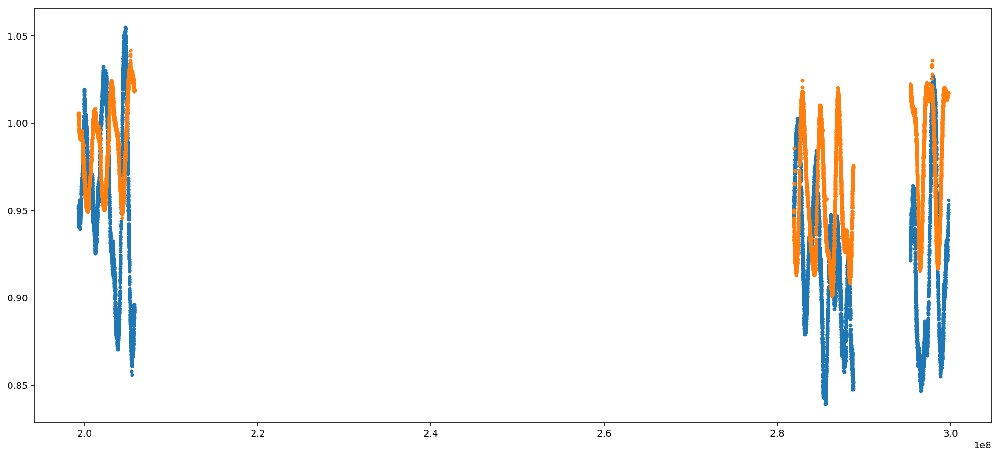

In [59]:
plt.figure(figsize=(18, 8))
plt.plot(t, gp.sample(), '.')
plt.plot(t, df.flux.values, '.')

(0.8, 1.2)

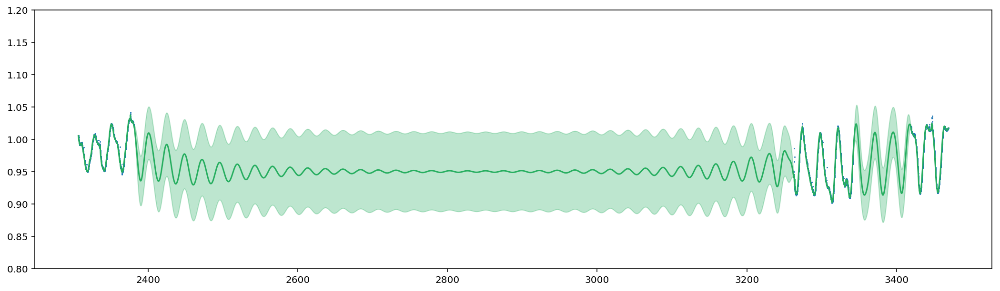

In [60]:
t_dense = np.linspace(t[0], t[-1], num=5000)
mu, var = gp.predict(df.flux.values, t_dense, return_var=True)
std = np.sqrt(var)

plt.figure(figsize=(18,5))
plt.plot(t*u.second.to(u.day), df.flux, '.', ms=1)

plt.plot(t_dense*u.second.to(u.day), mu, color='#27ae60')
plt.fill_between(t_dense*u.second.to(u.day), 
                 mu+std, mu-std, alpha=0.3, color='#27ae60', edgecolor="none")

plt.ylim(0.8, 1.2)

## Now let's apply to the ASASSN data!

In [58]:
df_ASASSN = df_ASASSN.sort_values('time').reset_index(drop=True)

In [60]:
t = df_ASASSN.time.values*u.day.to(u.second)
y = df_ASASSN.flux.values
yerr = df_ASASSN.flux_err.values

<ErrorbarContainer object of 3 artists>

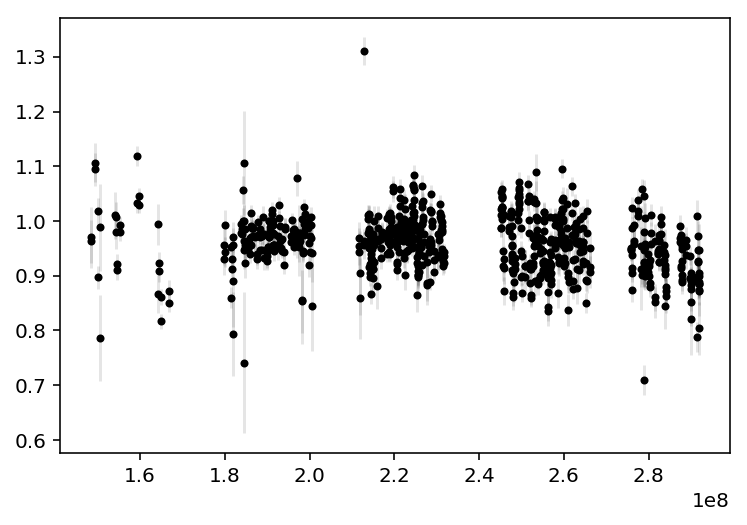

In [61]:
plt.plot(t, y,".k")
plt.errorbar(t, y, yerr=yerr, fmt=".k", capsize=0, alpha=0.1)
#plt.ylim(0.985, 1.0)
#plt.xlim(3272, 3273)


In [62]:
gp.get_parameter_vector()

array([  1.54195776,   3.3185561 , -12.70878375, -13.79513154,
       -10.1312116 ,   0.59341742,   2.27693389, -12.00879505,
         5.26091218,  -0.34640213, -14.49487221,  -6.71780598,
         0.96771071])

In [65]:
gp.compute(t, yerr=yerr)

(0.8, 1.2)

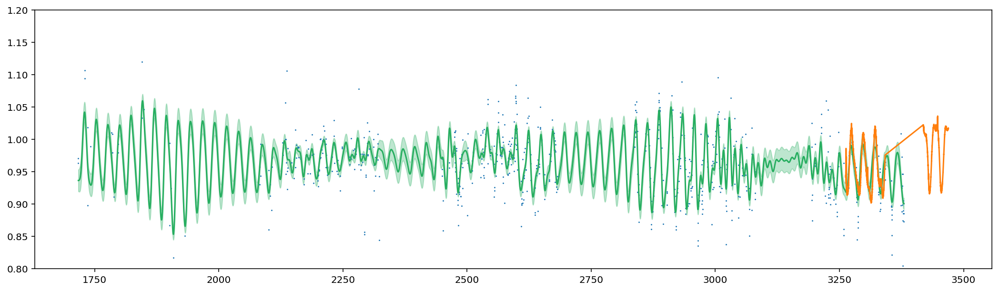

In [67]:
t_dense = np.linspace(t[0], t[-1], num=5000)
mu, var = gp.predict(y, t_dense, return_var=True)
std = np.sqrt(var)

plt.figure(figsize=(18,5))
plt.plot(t*u.second.to(u.day), y, '.', ms=1)

plt.plot(t_dense*u.second.to(u.day), mu, color='#27ae60')
plt.fill_between(t_dense*u.second.to(u.day), 
                 mu+std, mu-std, alpha=0.3, color='#27ae60', edgecolor="none")

plt.plot(df.time, df.flux.values)

plt.ylim(0.8, 1.2)

Meh?